<a href="https://colab.research.google.com/github/afonsotmm/computer-vision-lego-kit-assembly/blob/main/lego_kit_assembly.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Identification**

* **Name:** Afonso Tomás de Magalhães Mateus
* **Student Number:** 202204126

* **Name:** Diogo Soares de Albergaria Oliveira
* **Student Number:** 202108325


---




# **Initial setup**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install opencv-python

In [ ]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow
import glob
import os
import matplotlib.pyplot as plt
from dataclasses import dataclass
from pathlib import Path
import pandas as pd
from IPython.display import display

# **Exercise 1**
>This exercise aims to calibrate the camera used in the Lego inspection setup to obtain accurate geometric parameters for subsequent image analysis. The calibration process involves estimating the intrinsic parameters (focal length, principal point, and distortion coefficients) and the extrinsic parameters that describe the camera's position and orientation relative to the scene. From these results, a precise pixel-to-millimeter conversion factor is derived, enabling reliable measurement and object size estimation in later tasks.

### **Ex.1 Assets**

* **ChessboardParameters Class**

In [ ]:
@dataclass
class ChessboardParameters:
  columns_number: int
  rows_number: int
  square_size_meters: float

* **Known Chessboard's Parameters**

In [ ]:
# Columns number:     12
# Rows number:         9
# Square size (mm):   15

chessboard_parameters = ChessboardParameters(12, 9, 0.015)

* **CalibrationResult Class**

In [ ]:
@dataclass
class CalibrationResult:
  ret: float
  K: np.ndarray
  dist: np.ndarray
  rvecs: list
  tvecs: list

**1. Re-projection Error ($\text{ret}$):**
$$
\text{error} =
\sqrt{\frac{1}{M}\sum_{i=1}^{M}\lVert x_i - \hat{x}_i \rVert^2}
$$
This value measures the average pixel difference between detected and projected points.

<br><br>

**2. Intrinsic Matrix ($K$):**
$$
K =
\begin{bmatrix}
f_x & 0 & c_x \\
0 & f_y & c_y \\
0 & 0 & 1
\end{bmatrix}
$$
where  
- $ f_x, f_y $: focal lengths in pixels  
- $ c_x, c_y $: coordinates of the optical center  

<br><br>

**2. Distortion Coefficients ($\text{dist}$):**
$$
\text{dist} = [k_1,\; k_2,\; p_1,\; p_2,\; k_3]
$$
where  
- $ k_1, k_2, k_3 $: radial distortion terms  
- $ p_1, p_2 $: tangential distortion terms  

<br><br>

**3. Rotation Vectors ($r_{vecs}$):**
$$
r_{vec_i} =
\begin{bmatrix}
r_x \\
r_y \\
r_z
\end{bmatrix},
\quad i = 1, \dots, N
$$
Each vector defines the **orientation** of the camera relative to the calibration pattern in image $i$.

<br><br>

**4. Translation Vectors ($t_{vecs} $):**
$$
t_{vecs_i}  =
\begin{bmatrix}
t_x \\
t_y \\
t_z
\end{bmatrix},
\quad i = 1, \dots, N
$$
Each vector defines the **position** of the camera relative to the calibration pattern in image $i$.


* **Calibration function**

In [ ]:
# -> Compute World referential points and its correspondency at the Image referential (3D (meters) -> 2D (pixels))
def calibrate_via_chessboard(images, chessboard_parameters, show):

  # Termination criteria
  criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

  # Parameters
  chessboard_corners_x = chessboard_parameters.columns_number - 1
  chessboard_corners_y = chessboard_parameters.rows_number - 1

  # Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
  objp = np.zeros((chessboard_corners_y*chessboard_corners_x,3), np.float32)
  objp[:,:2] = np.mgrid[0:chessboard_corners_x,0:chessboard_corners_y].T.reshape(-1,2)
  objp = chessboard_parameters.square_size_meters * objp

  # Arrays to store object points and image points from all the images.
  objpoints = [] # 3d point in real world space
  imgpoints = [] # 2d points in image plane.

  image_size = None # Initialize image_size before the loop

  for fname in images:
    img = cv.imread(fname)
    if img is None:
        continue
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    image_size = gray.shape[::-1] # Define image_size

    # Find the chess board corners
    ret, corners = cv.findChessboardCorners(gray, (chessboard_corners_x, chessboard_corners_y), None)

    # If found, add object points, image points (after refining them)
    if ret == True:
      objpoints.append(objp)

      corners2 = cv.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
      imgpoints.append(corners2)

      if show == True:
        # Draw and display the corners
        cv.drawChessboardCorners(img, (chessboard_corners_x, chessboard_corners_y), corners2, ret)
        cv2_imshow(img)

  # Calibrate
  # Check if imgpoints is not empty before calling calibrateCamera
  if imgpoints:
      ret, K, dist, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, image_size, None, None)
  else:
      ret, K, dist, rvecs, tvecs = False, None, None, None, None # Return None or appropriate values if calibration fails


  return ret, K, dist, rvecs, tvecs

* **Undistort function**

In [ ]:
def undistort_image(image, K, dist, alpha):

  # Scalling
  h, w = image.shape[:2]

  newcamera_K, roi = cv.getOptimalNewCameraMatrix(K, dist, (w,h), alpha, (w,h))

  # undistort
  undst_img = cv.undistort(image, K, dist, None, newcamera_K)

  # crop the image
  x, y, w_roi, h_roi = roi
  if w_roi > 0 and h_roi > 0:
      undst_img = undst_img[y:y+h_roi, x:x+w_roi]

  return undst_img

* **Get Extrinsic Parameters function**
> **Note**: This function assumes that the image received is already undistorced (that's why we consider dist = None)

In [ ]:
def get_extrinsic_parameters(undst_img, intrinsic_parameters, chessboard_parameters):

  # Parameters
  chessboard_corners_x = chessboard_parameters.columns_number - 1
  chessboard_corners_y = chessboard_parameters.rows_number - 1

  objp = np.zeros((chessboard_corners_x*chessboard_corners_y,3), np.float32)
  objp[:,:2] = np.mgrid[0:chessboard_corners_x,0:chessboard_corners_y].T.reshape(-1,2)
  objp = chessboard_parameters.square_size_meters * objp

  gray = cv.cvtColor(undst_img,cv.COLOR_BGR2GRAY)
  ret, corners = cv.findChessboardCorners(gray, (chessboard_corners_x,chessboard_corners_y), None)
  dist = None

  if not ret:
      raise RuntimeError("[get_extrinsic_parameters]: findChessboardCorners failed")

  # Find the rotation and translation vectors.
  pnp_ret, rvec, tvec = cv.solvePnP(objp, corners, intrinsic_parameters.K, dist)

  if pnp_ret == False:

    raise RuntimeError("[get_extrinsic_parameters]: solvePnP failed.")

  return rvec, tvec, corners

### **(a) - Intrinsic Calibration**

>Estimation of intrinsic parameters and lens distortion coefficients from multiple calibration attempts, followed by selection of the configuration with the lowest reprojection error.


**(i) Calibration 1**












In [ ]:
folder_calib_1 = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Calibration/calib1/'
images_1 = sorted(glob.glob(folder_calib_1 + '*.png'))
show_images_1 = False

ret_1, K_1, dist_1, rvecs_1, tvecs_1 = calibrate_via_chessboard(images_1, chessboard_parameters, show_images_1)

calib_1 = CalibrationResult(ret_1, K_1, dist_1, rvecs_1, tvecs_1)

# --- Debug -----
print(" -> Intrinsic Matrix: ")
print(calib_1.K)

print("")

print(" -> Distorion Coefficients: ")
print(calib_1.dist)

print("")

print(f" -> Re-projection Error: {calib_1.ret}")


 -> Intrinsic Matrix: 
[[827.57850219   0.         334.83395629]
 [  0.         827.43751149 281.31040416]
 [  0.           0.           1.        ]]

 -> Distorion Coefficients: 
[[-0.43653625  0.40330902 -0.0013504   0.00154947 -0.53358644]]

 -> Re-projection Error: 0.9256905073033473


* **Intrinsic Matrix (K):**
<br>
$$
K = \begin{bmatrix}
827.5785 & 0 & 334.8340 \\
0 & 827.4375 & 281.3104 \\
0 & 0 & 1
\end{bmatrix}
$$

<br><br>

* **Distortion Coefficients:**
<br>
$$
\text{dist} =
\begin{bmatrix}
-0.4365 & 0.4033 & -0.0014 & 0.0015 & -0.5336
\end{bmatrix}
$$

<br><br>

* **Re-projection Error:**
$$ E_{RMS} = 0.9257 $$

<br>

---


**(ii) Calibration 2**

In [ ]:
folder_calib_2 = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Calibration/calib2/'
images_2 = sorted(glob.glob(folder_calib_2 + '*.png'))
show_images_2 = False

ret_2, K_2, dist_2, rvecs_2, tvecs_2 = calibrate_via_chessboard(images_2, chessboard_parameters, show_images_2)

calib_2 = CalibrationResult(ret_2, K_2, dist_2, rvecs_2, tvecs_2)

# --- Debug ----
print(" -> Intrinsic Matrix: ")
print(calib_2.K)

print("")

print(" -> Distorion Coefficients: ")
print(calib_2.dist)

print("")

print(f" -> Re-projection Error: {calib_2.ret}")

 -> Intrinsic Matrix: 
[[839.07615265   0.         339.34164595]
 [  0.         839.32227556 276.31090529]
 [  0.           0.           1.        ]]

 -> Distorion Coefficients: 
[[-4.32165948e-01  2.83161213e-01 -2.23956506e-04  4.15190941e-04
  -1.38438500e-01]]

 -> Re-projection Error: 0.09807000525111947


* **Intrinsic Matrix (K):**
<br>
$$
K = \begin{bmatrix}
839.0762 & 0 & 339.3416 \\
0 & 839.3223 & 276.3109 \\
0 & 0 & 1
\end{bmatrix}
$$

<br><br>

* **Distortion Coefficients:**
<br>
$$
\text{dist} =
\begin{bmatrix}
-0.4322 & 0.2832 & -0.0002 & 0.0004 & -0.1384
\end{bmatrix}
$$

<br><br>

* **Re-projection Error:**
$$ E_{RMS} = 0.0981 $$

<br>

---

**(iii) Calibration 3**


In [ ]:
folder_calib_3 = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Calibration/calib3/'
images_3 = sorted(glob.glob(folder_calib_3 + '*.png'))
show_images_3 = False

ret_3, K_3, dist_3, rvecs_3, tvecs_3 = calibrate_via_chessboard(images_3, chessboard_parameters, show_images_3)

calib_3 = CalibrationResult(ret_3, K_3, dist_3, rvecs_3, tvecs_3)

# --- Debug ----
print(" -> Intrinsic Matrix: ")
print(calib_3.K)

print("")

print(" -> Distorion Coefficients: ")
print(calib_3.dist)

print("")

print(f" -> Re-projection Error: {calib_3.ret}")

 -> Intrinsic Matrix: 
[[837.55342254   0.         338.44589428]
 [  0.         837.73983656 276.54574964]
 [  0.           0.           1.        ]]

 -> Distorion Coefficients: 
[[-4.45524998e-01  3.95183801e-01 -4.52503299e-04  2.07693657e-04
  -4.44972736e-01]]

 -> Re-projection Error: 0.5066609032930021


* **Intrinsic Matrix (K):**
<br>
$$
K = \begin{bmatrix}
837.5534 & 0 & 338.4459 \\
0 & 837.7398 & 276.5457 \\
0 & 0 & 1
\end{bmatrix}
$$

<br><br>

* **Distortion Coefficients:**
<br>
$$
\text{dist} =
\begin{bmatrix}
-0.4455 & 0.3952 & -0.0005 & 0.0002 & -0.4450
\end{bmatrix}
$$

<br><br>

* **Re-projection Error:**
$$ E_{RMS} = 0.5067 $$

<br>

---

**Choosing the best Calibration set of images**


In [ ]:
calibrations = {
  "Calibration_1": calib_1,
  "Calibration_2": calib_2,
  "Calibration_3": calib_3
}

best_name = None
best_calib = None
min_error = float('inf')

for name, calib in calibrations.items():
  if calib.ret < min_error:
      min_error = calib.ret
      best_name = name
      best_calib = calib

print("")
print(f"Best calibration: {best_name} (error = {best_calib.ret})")


Best calibration: Calibration_2 (error = 0.09807000525111947)


### **Results**

Set 2 is selected because it offers the widest pose diversity and field-of-view coverage (center and all four corners under multiple orientations) with consistently sharp imagery, yielding the lowest RMS re-projection error.
Set 1 is limited by poor pose variation (orientation and position), while Set 3, despite greater diversity than Set 1, contains occasional defocus and remains less diverse than Set 2.

<br>

This finding is consistent with the **RMS re-projection errors** for the three calibration sets:

$$ E_{\text{RMS}}(\text{Set 2}) \;<\; E_{\text{RMS}}(\text{Set 3}) \;<\; E_{\text{RMS}}(\text{Set 1}) $$

$$\quad (0.098 \;<\; 0.507 \;<\; 0.926) $$



---



### **(b) - Extrinsic Calibration**

>Estimation of the camera pose (rotation and translation) from “final setup.png”, with reporting of the extrinsic matrix
$[R ∣ t]$ and derivation of the pixel-to-millimeter conversion factor for subsequent metric measurements.

Once the intrinsic and distortion parameters of the camera have been determined, an undistorted image can be obtained. Considering that final_setup.png captures the same camera pose relative to the inspection plane as in the Lego acquisition (i.e., identical distance and orientation with respect to the plane), the extrinsic matrix was estimated to characterize this geometry. From this calibration, the pixel-to-millimeter conversion factor was derived and will be used in the subsequent analysis of the Lego images acquired on the same plane.

**Setup image undistortion**

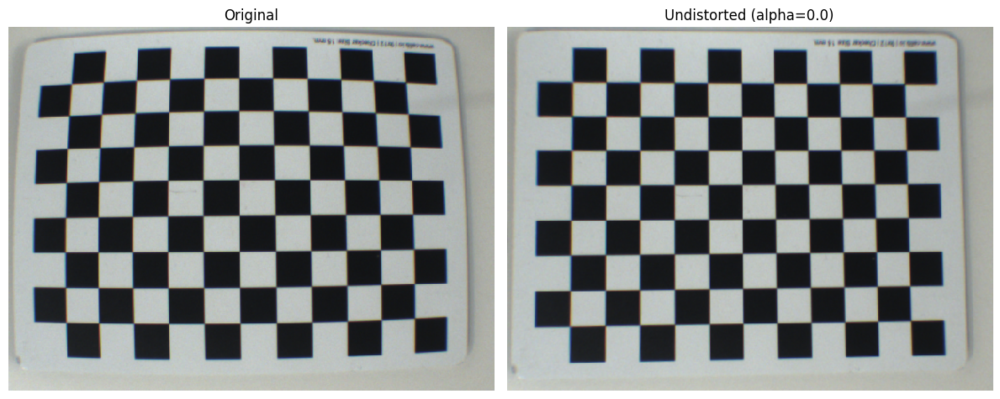

In [ ]:
setup_image = cv.imread('/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Calibration/final_setup.png')

K = best_calib.K
dist = best_calib.dist

alpha = 0.0
undst_img = undistort_image(setup_image, K, dist, alpha)

# ---- Show side by side with matplotlib ----
orig_rgb = cv.cvtColor(setup_image, cv.COLOR_BGR2RGB)
und_rgb  = cv.cvtColor(undst_img, cv.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(orig_rgb, interpolation='nearest')
axes[0].set_title("Original"); axes[0].axis('off')

axes[1].imshow(und_rgb, interpolation='nearest')
axes[1].set_title(f"Undistorted (alpha={alpha})"); axes[1].axis('off')

plt.tight_layout()
plt.show()

# -------------------------------------------


**Calibration of the extrinsic parameters of the camera setup**


In [ ]:
rvec, tvec, corners = get_extrinsic_parameters(undst_img, best_calib, chessboard_parameters)
# rvec: 3x1; tvec: 3x1;  R: 3x3;  [R|t]: 3x4
R, _ = cv.Rodrigues(rvec)
world_to_cam = np.hstack([R, tvec])

print(" -> Extrinsic Matrix: ")
print(world_to_cam)


 -> Extrinsic Matrix: 
[[-0.99781443 -0.01109167 -0.06514096  0.06524178]
 [ 0.00896863 -0.99942189  0.03279402  0.03647397]
 [-0.06546704  0.03213812  0.99733706  0.28527033]]


**Estimation of the pixel-to-millimeter conversion factor**


To estimate the pixel-to-millimeter conversion factor, the average distance between adjacent corners of the calibration chessboard was computed in pixel units. Considering the known physical size of each square, this ratio provides a reliable scale conversion between image measurements and real-world dimensions.

In [ ]:
pixel_distance = np.linalg.norm(corners[1] - corners[0])
square_size_mm = chessboard_parameters.square_size_meters*1000
pixel_per_mm = pixel_distance / square_size_mm
print(f" -> Ratio (px/mm): {pixel_per_mm:.2f}")

 -> Ratio (px/mm): 2.88


With both the intrinsic and extrinsic calibration parameters established, the camera model is now fully defined, enabling its use for accurate metric measurements and object analysis in the Lego image dataset.

---

# **Exercise 2**
>This exercise focuses on analyzing isolated LEGO brick images to extract quantitative information about their color, size, and area. A region of interest (ROI) is first defined to isolate the relevant part of each image and remove background noise. The image “colored bricks.png” is then processed to count the number of bricks grouped by color. Subsequently, for the individual color images (“blue.png”, “green.png”, “red.png”, and “yellow.png”), the bricks are grouped by size (e.g., 2x1, 2x2, 2x4), and their average area and standard deviation are calculated in both pixels and square millimeters using the previously obtained pixel-to-millimeter conversion factor. The results are summarized in a table presenting the average area and variability for each brick size and color, providing a quantitative basis for the classification and verification tasks in the following exercises.


## **Ex.2 Assets**

**Color Ranges (HSV)**
> Obtained Experimentally

In [ ]:
COLOR_RANGES = {
  'blue': {
      'light': ([  70, 138,  75], [ 108, 182, 255]),
      'dark':  ([ 108, 172,  75], [ 134, 255, 255]),
  },
  'green': {
      'light': ([  32, 106,   0], [  68, 255, 255]),
      'dark':  ([  32,  81, 125], [  68, 255, 255]),
  },
  'yellow': {
      'light': ([  11, 151, 135], [  29, 255, 255]),
      'dark':  ([  22, 120, 149], [ 180, 255, 255]),
  },
  'red': {
      'light': ([   0, 170,  75], [  10, 255, 255]),
      'dark':  ([ 170, 170,  75], [ 180, 255, 255]),
  },
  #'white': ([   0,   0, 180], [ 180,  30, 255])
}

**Available Brick's Colors (BGR)**

In [ ]:
BRICK_COLORS = {
    "blue":   (255, 0, 0),
    "green":  (0, 255, 0),
    "yellow": (0, 255, 255),
    "red":    (0, 0, 255),
    "white":  (255, 255, 255),
}

**Brick's Known Sizes**

In [ ]:
# in mm^2 (w*h)
BRICK_SIZES = {
  '2x1':  32*15,
  '2x2':  32*32,
  '2x4':  32*64,
  '2x6':  32*95,
  'R2x2': 32*47,
}

###**Relevant Classes:**

* **Pose Class**


In [ ]:
@dataclass
class Pose:
  x: float
  y: float

* **Dimension and UnitAwareDimension Classes:**

In [ ]:
# ==============================================
#               Dimension Class
# ==============================================
@dataclass(slots=True)
class Dimension:
    width:  float
    height: float

    @property
    def area(self) -> float:
        return self.width * self.height


# =====================================================
#              UnitAwareDimension Class
# =====================================================
class UnitAwareDimension:
  def __init__(self, pixel_per_mm=2.88, width_px=None, height_px=None, width_mm=None, height_mm=None):

    self.pixel_per_mm = pixel_per_mm

    if width_px is not None and width_mm is None:
      width_mm = self.convert_to_mm(width_px)

    if width_mm is not None and width_px is None:
      width_px = self.convert_to_px(width_mm)

    if height_px is not None and height_mm is None:
      height_mm = self.convert_to_mm(height_px)

    if height_mm is not None and height_px is None:
      height_px = self.convert_to_px(height_mm)

    if height_mm is None and height_px is None:
      raise ValueError("Invalid height")
    if width_mm is None and width_px is None:
      raise ValueError("Invalid width")

    self.dimension_px = Dimension(width_px, height_px)
    self.dimension_mm = Dimension(width_mm, height_mm)



  def convert_to_mm(self, px):
    return (px / self.pixel_per_mm)

  def convert_to_px(self, mm):
    return (mm * self.pixel_per_mm)

* **BoxShape Class**
> For simplicity we consider that the contour that surrounds the Lego Brick is a box

In [ ]:
class BoxShape:
  def __init__(self, contour):
    self.contour = contour
    self.rect, self.box_points = self.compute_box()
    self.dimension = self.compute_dimensions()
    self.centroid  = self.compute_centroid()

  def compute_box(self):
    rect = cv.minAreaRect(self.contour)
    box_points = cv.boxPoints(rect).astype(int)
    return rect, box_points

  def compute_dimensions(self):
    (w, h) = self.rect[1]
    return UnitAwareDimension(width_px=w, height_px=h, pixel_per_mm=pixel_per_mm)

  def compute_centroid(self):
    M = cv.moments(self.contour)
    cx = int(M['m10']/M['m00'])
    cy = int(M['m01']/M['m00'])
    return Pose(cx, cy)


* **LegoBrick Class**


In [ ]:
@dataclass
class LegoBrick:
  id: int
  color: str
  size_class: str
  shape: BoxShape

* **MultiFormat Class**

  > To make later processing easier, a small class is used to store several color versions of the same image. For simplicity, the current version assumes the input is in BGR, from which it creates and stores the other versions of the same image (RGB, HSV and grayscale).

In [ ]:
class MultiFormat:
    def __init__(self, *, bgr=None, rgb=None, hsv=None, gray=None):

        inputs = [bgr, rgb, hsv, gray]
        num_inputs = sum(x is not None for x in inputs)

        if num_inputs > 1:
            raise ValueError("Provide just one image format")

        if bgr is not None:
            self.bgr = bgr
        elif rgb is not None:
            self.bgr = cv.cvtColor(rgb, cv.COLOR_RGB2BGR)
        elif hsv is not None:
            self.bgr = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)
        elif gray is not None:
            self.bgr = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)

        self.rgb  = cv.cvtColor(self.bgr, cv.COLOR_BGR2RGB)
        self.hsv  = cv.cvtColor(self.bgr, cv.COLOR_BGR2HSV)
        self.gray = cv.cvtColor(self.bgr, cv.COLOR_BGR2GRAY)

* **Image Class**

In [ ]:
class Image:
  def __init__(self, name, multiformat_image: MultiFormat):
    self.name = name
    self.formats = multiformat_image
    self.masks = self.get_masks()
    self.bricks: list[LegoBrick] = []


  # ===== Contour's Detection and Drawing =====
  def get_contours(self, mask, min_area=4000, preprocess=False):
    if preprocess:
        mask = cv.medianBlur(mask, 5)
        kernel = np.ones((5, 5), np.uint8)
        mask = cv.morphologyEx(mask, cv.MORPH_CLOSE, kernel)

    contours, _ = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    kept = []
    for cnt in contours:
      area = cv.contourArea(cnt)
      if area >= float(min_area):
          kept.append(cnt)
    return kept


  # ========== Masks Computation ===========
  def get_masks(self):

      hsv = self.formats.hsv
      masks = {
          'blue': cv.bitwise_or(
              cv.inRange(hsv, np.array(COLOR_RANGES['blue']['light'][0]), np.array(COLOR_RANGES['blue']['light'][1])),
              cv.inRange(hsv, np.array(COLOR_RANGES['blue']['dark'][0]),  np.array(COLOR_RANGES['blue']['dark'][1]))
          ),

          'green': cv.bitwise_or(
              cv.inRange(hsv, np.array(COLOR_RANGES['green']['light'][0]), np.array(COLOR_RANGES['green']['light'][1])),
              cv.inRange(hsv, np.array(COLOR_RANGES['green']['dark'][0]),  np.array(COLOR_RANGES['green']['dark'][1]))
          ),

          'yellow': cv.bitwise_or(
              cv.inRange(hsv, np.array(COLOR_RANGES['yellow']['light'][0]), np.array(COLOR_RANGES['yellow']['light'][1])),
              cv.inRange(hsv, np.array(COLOR_RANGES['yellow']['dark'][0]),  np.array(COLOR_RANGES['yellow']['dark'][1]))
          ),

          'red': cv.bitwise_or(
              cv.inRange(hsv, np.array(COLOR_RANGES['red']['light'][0]), np.array(COLOR_RANGES['red']['light'][1])),
              cv.inRange(hsv, np.array(COLOR_RANGES['red']['dark'][0]),  np.array(COLOR_RANGES['red']['dark'][1]))
          ),

          #'white': cv.inRange(hsv, np.array(COLOR_RANGES['white'][0]), np.array(COLOR_RANGES['white'][1])),
      }

      return masks


  # ========== Bricks Computations ==========
  def classify_by_size(self, brick):
      w, h = brick.shape.rect[1]  # dimensões do retângulo rotacionado
      if w == 0 or h == 0:
          return "unknown"

      ratio = max(w, h) / min(w, h)

      ref_ratios = {
          "2x1": 32 / 15,  # ~2.13
          "2x2": 32 / 32,  # 1.0
          "2x4": 64 / 32,  # 2.0
          "2x6": 95 / 32,  # ~2.97
          "R2x2": 47 / 32  # ~1.47
      }

      best_class = min(ref_ratios, key=lambda k: abs(ratio - ref_ratios[k]))
      return best_class


  def build_bricks(self, *, min_area=600.0, preprocess=False):
    self.bricks = []
    next_id = 1

    for color, mask in self.masks.items():
      contours = self.get_contours(mask=mask, min_area=min_area, preprocess=preprocess)
      for cnt in contours:
        shape = BoxShape(cnt)
        brick = LegoBrick(id=next_id, color=color, size_class="unknown", shape=shape)
        brick.size_class = self.classify_by_size(brick)
        self.bricks.append(brick)
        next_id += 1

    return self.bricks


  def show_bricks(self, *, id_show: bool = False, centroid_show: bool = False):

      out = self.formats.bgr.copy()

      for brick in self.bricks:
          box = brick.shape.box_points
          color = BRICK_COLORS.get(brick.color, (0, 255, 0))
          cv.drawContours(out, [box], -1, color, 2)

          cx, cy = int(brick.shape.centroid.x), int(brick.shape.centroid.y)

          if id_show:
              cv.putText(out, str(brick.id), (cx + 5, cy - 5), cv.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2, cv.LINE_AA)

          if centroid_show:
              cv.circle(out, (cx, cy), 3, (255, 255, 255), -1)

      plt.imshow(cv.cvtColor(out, cv.COLOR_BGR2RGB))
      plt.title(f"Detected Bricks: {len(self.bricks)}")
      plt.axis("off")
      plt.show()

      return out


  # ========== Bricks Managing Methods ==========

  def add_brick(self, brick: LegoBrick):
    self.bricks.append(brick)


  def initialize_bricks(self):
    self.bricks = []


  def get_bricks_by_color(self, color):
    result = []
    for brick in self.bricks:
        if brick.color == color:
            result.append(brick)
    return result


  def get_bricks_by_size(self, size_class):
    result = []
    for brick in self.bricks:
        if brick.size_class == size_class:
            result.append(brick)
    return result


  def get_bricks_by_color_and_size(self, color, size_class):
    result = []
    for brick in self.bricks:
        if brick.color == color and brick.size_class == size_class:
            result.append(brick)
    return result




###**Setup**

>The isolated set of images is first undistorted using the intrinsic parameters and distortion coefficients. Each undistorted result is stored as an ImageMultiFormat object for convenient access to RGB/HSV/gray views.

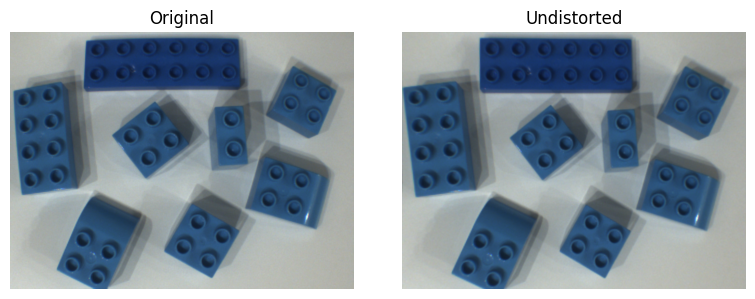

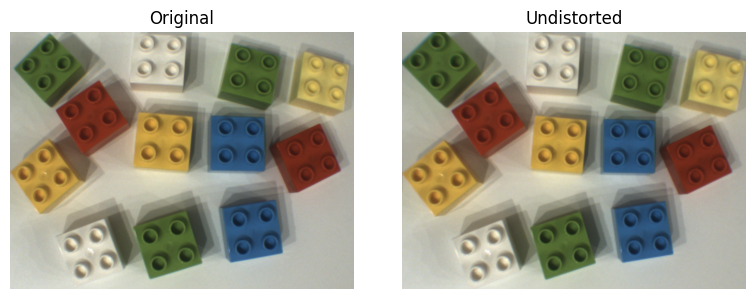

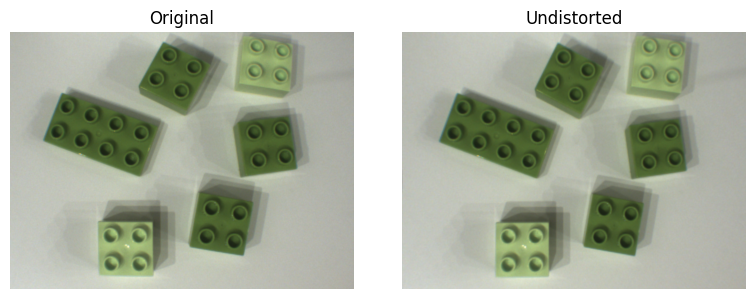

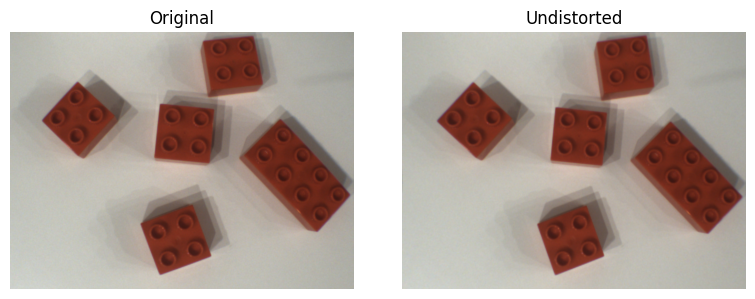

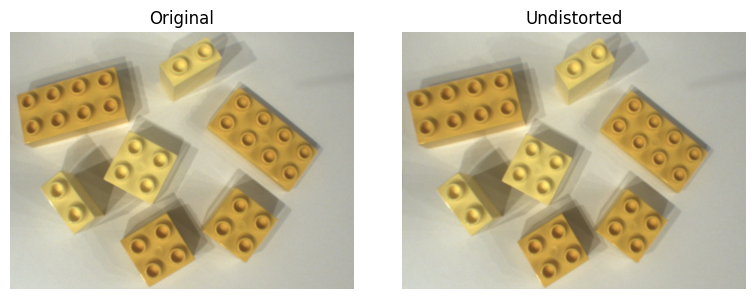

In [ ]:
isolated_images_folder = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Isolated'
isolated_original_images = sorted(glob.glob(isolated_images_folder + '/*.png'))
isolated_undistorted_images = []

for image_path in isolated_original_images:

  img = cv.imread(image_path)
  undst_img = undistort_image(img, K, dist, alpha)
  image_name = Path(image_path).name
  isolated_undistorted_images.append(Image(image_name, MultiFormat(bgr=undst_img)))

# Plot
for i, path in enumerate(isolated_original_images):
  orig_rgb = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
  und_rgb  = isolated_undistorted_images[i].formats.rgb

  plt.figure(figsize=(8,3))
  plt.subplot(1,2,1); plt.imshow(orig_rgb); plt.title("Original"); plt.axis('off')
  plt.subplot(1,2,2); plt.imshow(und_rgb);  plt.title("Undistorted"); plt.axis('off')
  plt.tight_layout(); plt.show()




### **(a) - Region of Interest (ROI) Definition**

>Identification and selection of a specific region within the image that contains the LEGO bricks, excluding irrelevant background areas.


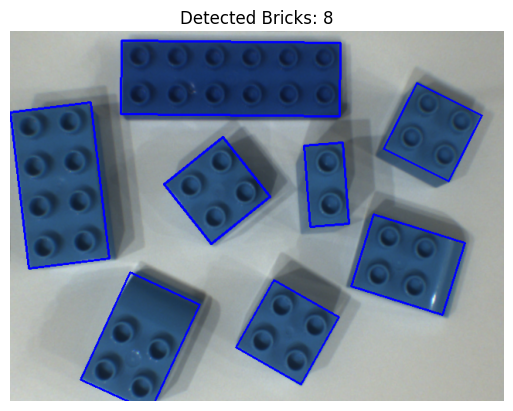

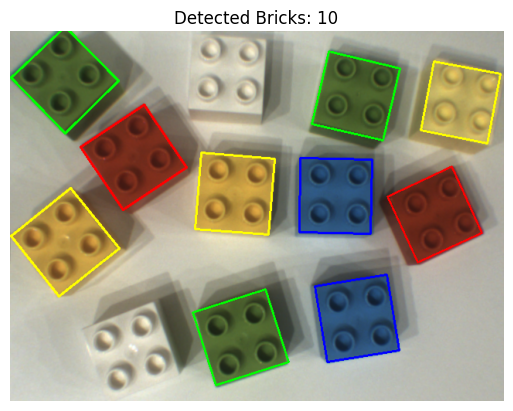

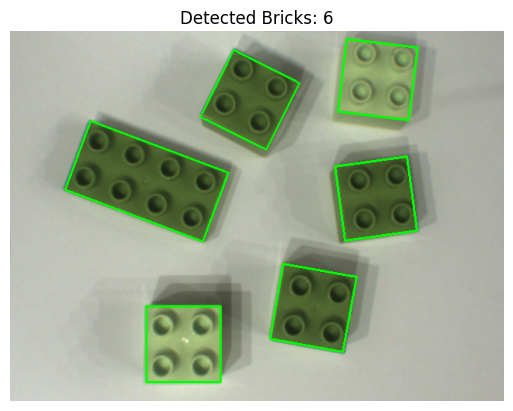

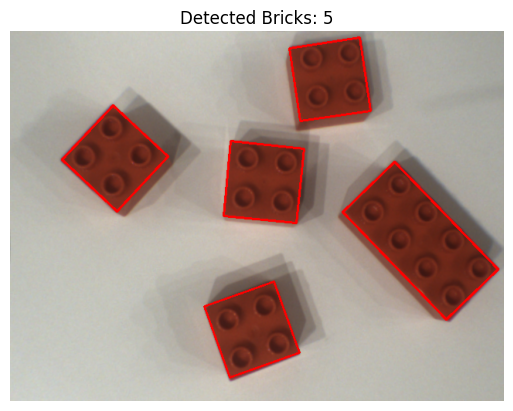

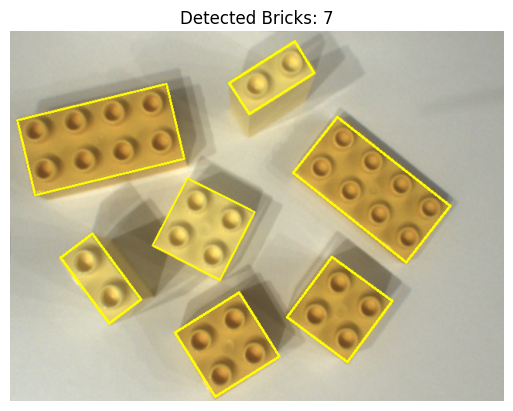

In [ ]:
for img in isolated_undistorted_images:
  img.build_bricks(min_area = 4000.0, preprocess = True)
  img.show_bricks(id_show = False, centroid_show = False)

### **(b) - Brick Color Counting**

> Detection and counting of LEGO bricks in the image “colored bricks.png”, grouping them according to their color categories.

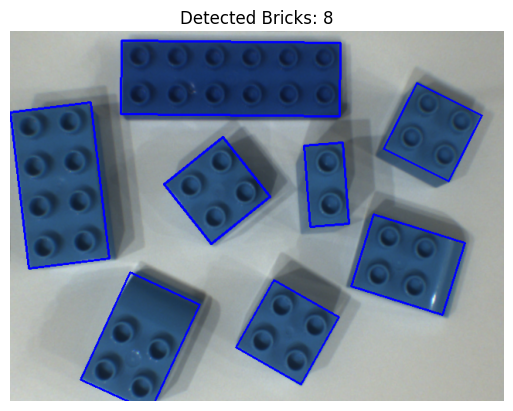

,blue,green,yellow,red,white
Image,,,,,
blue.png,8,0,0,0,0


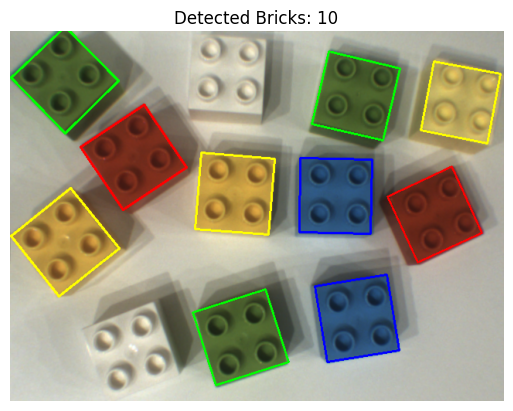

,blue,green,yellow,red,white
Image,,,,,
colored_bricks.png,2,3,3,2,0


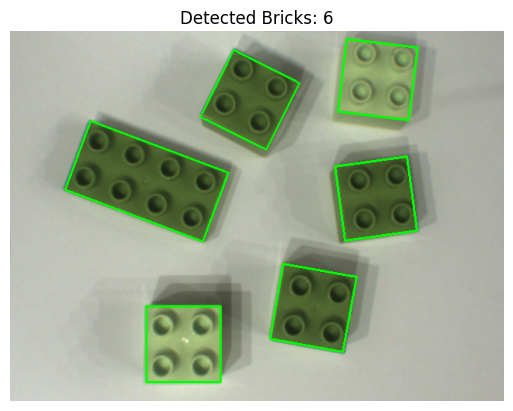

,blue,green,yellow,red,white
Image,,,,,
green.png,0,6,0,0,0


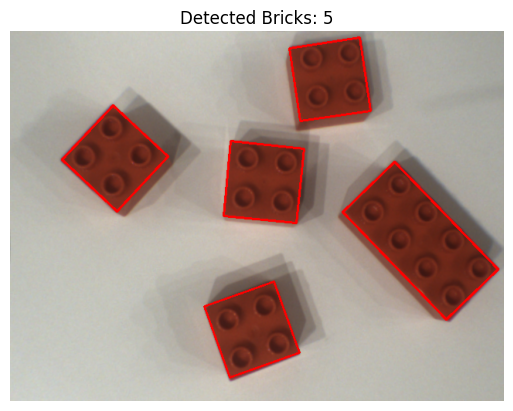

,blue,green,yellow,red,white
Image,,,,,
red.png,0,0,0,5,0


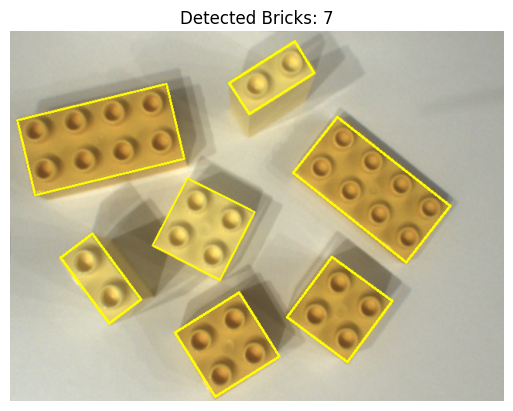

,blue,green,yellow,red,white
Image,,,,,
yellow.png,0,0,7,0,0


In [ ]:
for img in isolated_undistorted_images:

    img.show_bricks(id_show=False, centroid_show=False)

    row = {"Image": img.name}
    for color in BRICK_COLORS:
        row[color] = len(img.get_bricks_by_color(color))

    df_img = pd.DataFrame([row]).set_index("Image")
    display(df_img)
    print("")
    print("")


###**(c) - Size Grouping and Area Measurement**

> Classification of LEGO bricks by size from the images “blue.png”, “green.png”, “red.png”, and “yellow.png”, followed by the computation of the average area and standard deviation for each size in millimeters

                      Image: blue.png


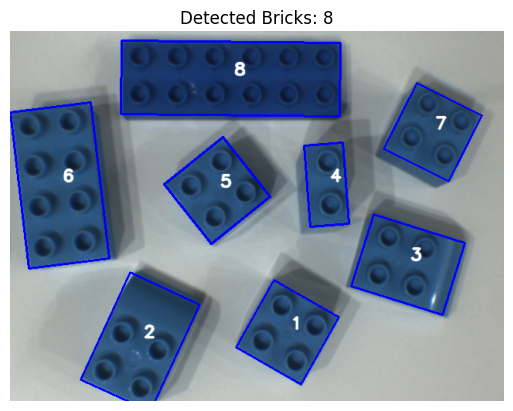

,Size,Count,IDs,Avg_Area_px,Avg_Area_mm,Std_Deviation_mm
0,2x1,1,4,5242.12,629.940002,NaN
1,2x2,3,"1, 5, 7",9391.93,1128.619995,42.790001
2,2x4,1,6,21295.59,2559.080078,NaN
3,2x6,1,8,26993.61,3243.810059,NaN
4,R2x2,2,"2, 3",13542.05,1627.339966,263.670013



                      Image: colored_bricks.png


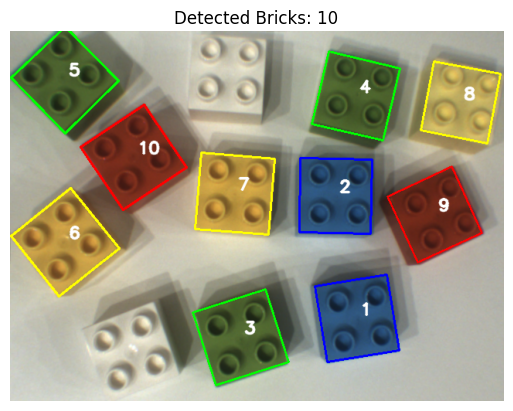

,Size,Count,IDs,Avg_Area_px,Avg_Area_mm,Std_Deviation_mm
0,2x2,10,"1, 2, 3, 4, 5, 6, 7, 8, 9, 10",9241.91,1110.599976,71.019997



                      Image: green.png


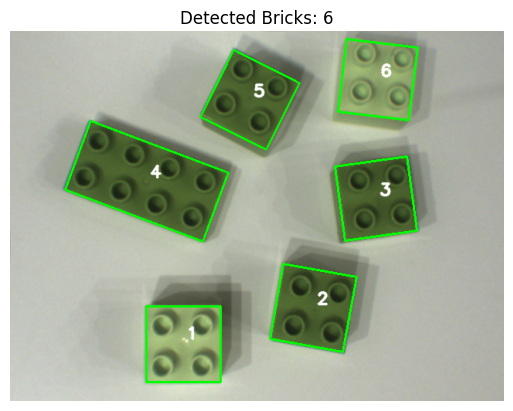

,Size,Count,IDs,Avg_Area_px,Avg_Area_mm,Std_Deviation_mm
0,2x2,5,"1, 2, 3, 5, 6",9160.68,1100.839966,32.310001
1,2x4,1,4,18124.75,2178.050049,NaN



                      Image: red.png


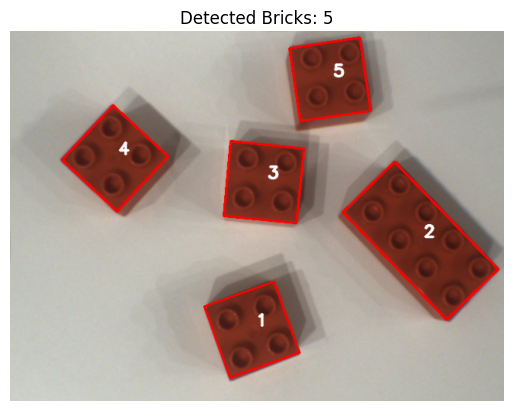

,Size,Count,IDs,Avg_Area_px,Avg_Area_mm,Std_Deviation_mm
0,2x2,4,"1, 3, 4, 5",9166.92,1101.589966,30.9
1,2x4,1,2,18060.00,2170.260010,NaN



                      Image: yellow.png


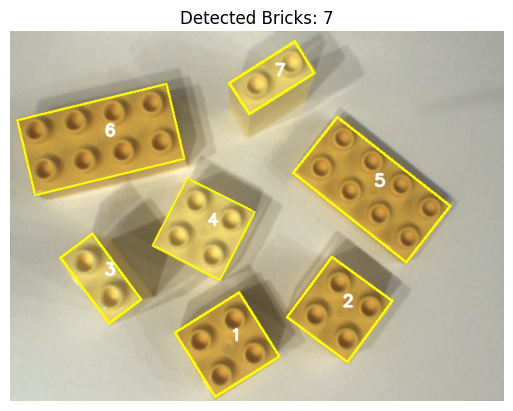

,Size,Count,IDs,Avg_Area_px,Avg_Area_mm,Std_Deviation_mm
0,2x1,2,"3, 7",5115.55,614.729980,48.720001
1,2x2,3,"1, 2, 4",9551.69,1147.819946,10.840000
2,2x4,2,"5, 6",18425.83,2214.229980,219.690002


In [ ]:
for img in isolated_undistorted_images:
    rows = []

    for brick in img.bricks:
        measured_mm = brick.shape.dimension.dimension_mm.area
        measured_px = brick.shape.dimension.dimension_px.area
        rows.append({
            "ID": brick.id,
            "Size": brick.size_class,
            "Measured Area (px)": measured_px,
            "Measured Area (mm)": measured_mm,
        })

    df = pd.DataFrame(rows)
    summary = (
        df.groupby("Size")
        .agg(
            Count=("ID", "count"),
            IDs=("ID", lambda x: ', '.join(map(str, x))),
            Avg_Area_px=("Measured Area (px)", "mean"),
            Avg_Area_mm=("Measured Area (mm)", "mean"),
            Std_Deviation_mm=("Measured Area (mm)", "std")
        )
        .reset_index()
        .round(2)
    )

    print("===================================================================")
    print(f"                      Image: {img.name}")
    print("===================================================================")
    img.show_bricks(id_show=True, centroid_show=False)
    plt.show()
    display(summary)
    print()


---

# **Exercise 3**
>...


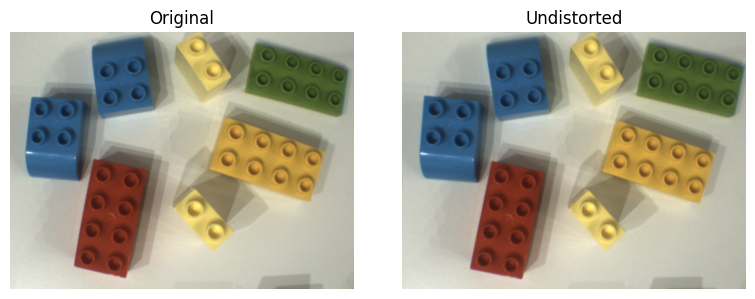

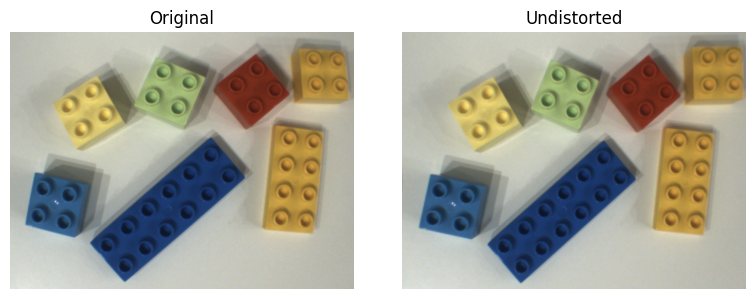

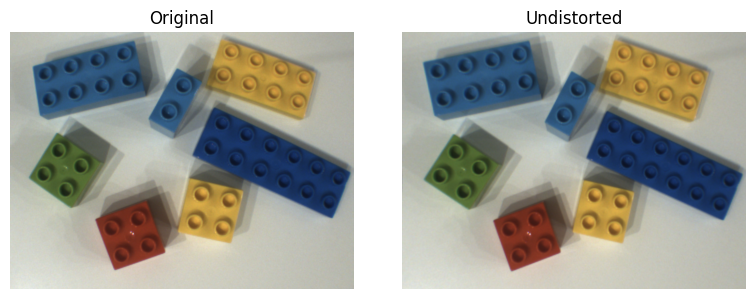

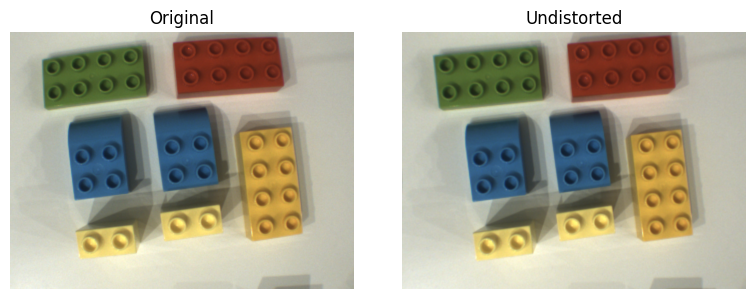

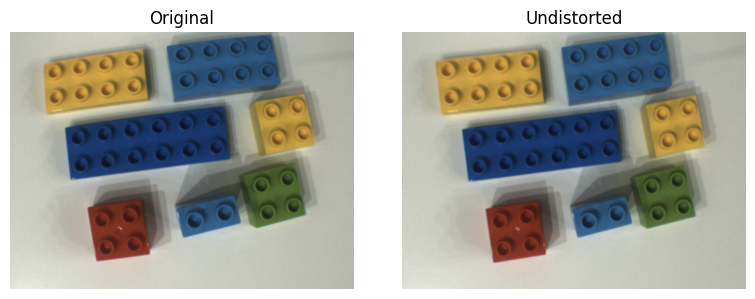

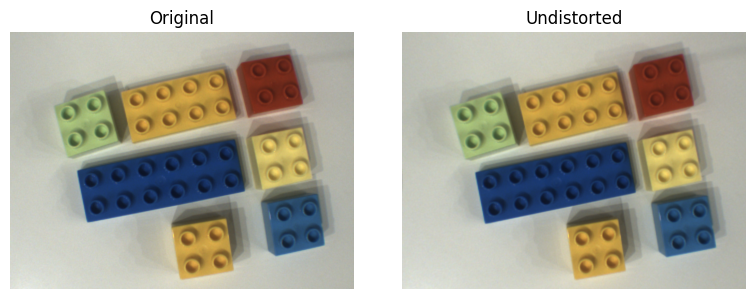

In [ ]:
isolated_images_folder = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Kit'
kit_original_images = sorted(glob.glob(isolated_images_folder + '/*.png'))
kit_undistorted_images = []

for image_path in kit_original_images:

  img = cv.imread(image_path)
  undst_img = undistort_image(img, K, dist, alpha)
  image_name = Path(image_path).name
  kit_undistorted_images.append(Image(image_name, MultiFormat(bgr=undst_img)))

# Plot
for i, path in enumerate(kit_original_images):
  orig_rgb = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
  und_rgb  = kit_undistorted_images[i].formats.rgb

  plt.figure(figsize=(8,3))
  plt.subplot(1,2,1); plt.imshow(orig_rgb); plt.title("Original"); plt.axis('off')
  plt.subplot(1,2,2); plt.imshow(und_rgb);  plt.title("Undistorted"); plt.axis('off')
  plt.tight_layout(); plt.show()

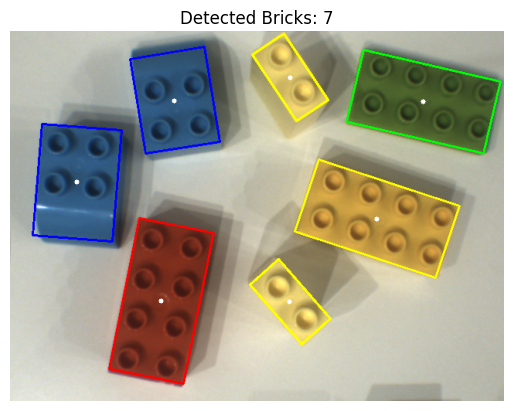

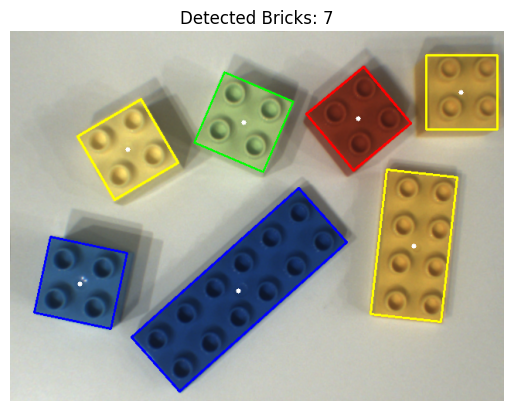

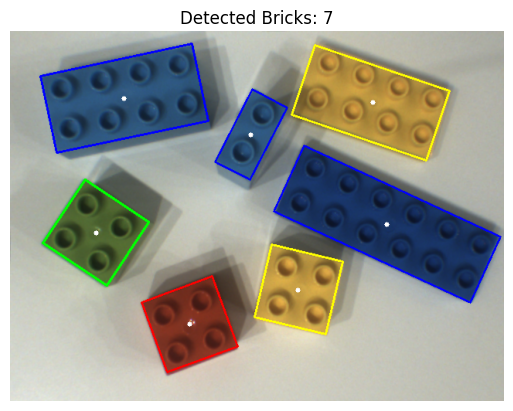

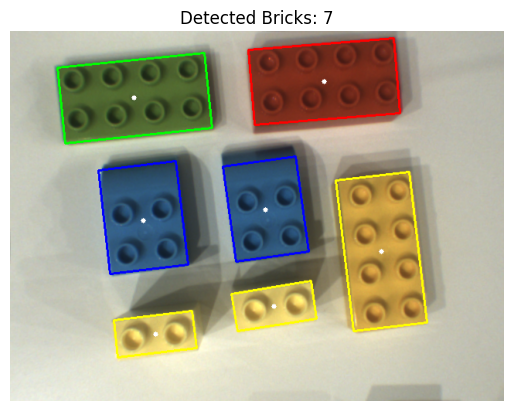

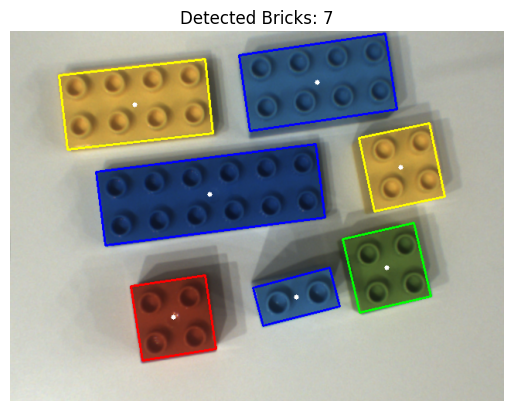

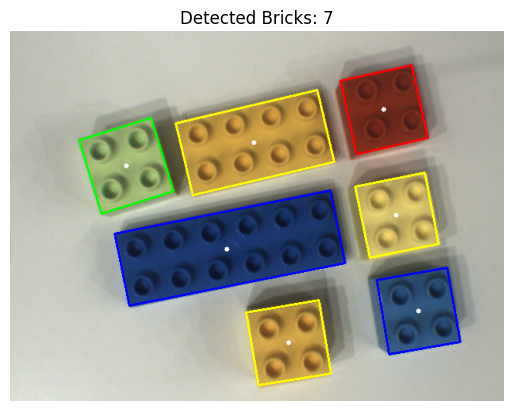

In [ ]:
for img in kit_undistorted_images:
    img.build_bricks(min_area = 4000.0, preprocess = True)
    img.show_bricks(id_show=False, centroid_show=True)

A procurar imagens em: /content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Fault
Carregadas e corrigidas 9 imagens.

--- RESULTADO PARA: ImageA_fault.png ---
Número de peças brancas detetadas: 1


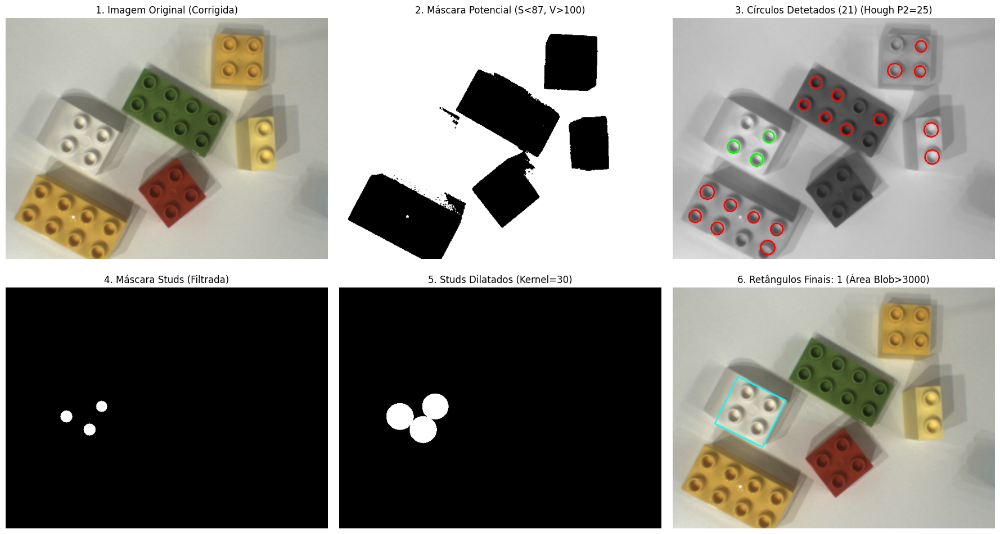

In [40]:
# =========================================================================
# 1. ⚠️ IMPORTS E DEFINIÇÕES ESSENCIAIS
# =========================================================================
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import glob
from pathlib import Path
from dataclasses import dataclass

# --- Funções Críticas ---
def undistort_image(image, K, dist, alpha):
    """ Corrige a distorção da lente da imagem. """
    h, w = image.shape[:2]
    newcamera_K, roi = cv.getOptimalNewCameraMatrix(K, dist, (w,h), alpha, (w,h))
    undst_img = cv.undistort(image, K, dist, None, newcamera_K)
    # Recorta a imagem para remover áreas pretas introduzidas pela correção
    x, y, w_roi, h_roi = roi
    if w_roi > 0 and h_roi > 0:
        undst_img = undst_img[y:y+h_roi, x:x+w_roi]
    return undst_img

def gray_world_wb(img):
    """ Aplica um balanço de brancos simples (Gray World assumption). """
    b,g,r = cv.split(img.astype(np.float32))
    m = (b.mean()+g.mean()+r.mean())/3.0
    # Evita divisão por zero
    b *= m/(b.mean()+1e-6); g *= m/(g.mean()+1e-6); r *= m/(r.mean()+1e-6)
    return np.clip(np.stack([b,g,r],2),0,255).astype(np.uint8)

# --- Classes de Dados ---
class MultiFormat:
    """ Guarda vários formatos (BGR, HSV, Gray) de uma imagem. """
    def __init__(self, *, bgr=None): # Removemos 'rgb' não utilizado
        if bgr is not None:
            self.bgr = bgr
            # Calcula e guarda automaticamente as outras versões
            self.hsv  = cv.cvtColor(self.bgr, cv.COLOR_BGR2HSV)
            self.gray = cv.cvtColor(self.bgr, cv.COLOR_BGR2GRAY)
        # Removemos self.orig_bgr, usando self.bgr como a imagem processada

@dataclass # Simplifica a criação da classe Image
class Image:
    """ Representa uma imagem do dataset com os seus formatos. """
    name: str
    formats: MultiFormat
    # masks: dict = field(default_factory=lambda: {'white': None}) # Removido se não usado no final
    # bricks: list = field(default_factory=list) # Removido se não usado no final


# =========================================================================
# 2. 📸 SETUP E CARREGAMENTO DAS IMAGENS
# =========================================================================

# --- Parâmetros de Calibração da Câmara ---
K = np.array([
    [839.0762, 0.0,      339.3416],
    [0.0,      839.3223, 276.3109],
    [0.0,      0.0,      1.0     ]
])
dist = np.array([-0.4322, 0.2832, -0.0002, 0.0004, -0.1384])
alpha = 0.0 # Controla o recorte após undistort (0=recorta, 1=mantém tudo)

# --- Leitura das Imagens ---
# Certifique-se que este caminho para a pasta 'Isolated' está correto!
isolated_images_folder = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Fault'

isolated_original_images = sorted(glob.glob(isolated_images_folder + '/*.png'))
isolated_undistorted_images = [] # Lista para guardar os objetos Image processados

print(f"A procurar imagens em: {isolated_images_folder}")
if not isolated_original_images:
    print("AVISO: Nenhuma imagem .png encontrada na pasta especificada.")

for image_path in isolated_original_images:
    img = cv.imread(image_path)
    if img is None:
        print(f"Aviso: Não foi possível ler a imagem: {image_path}")
        continue
    # Corrigir distorção
    undst_img = undistort_image(img, K, dist, alpha)
    image_name = Path(image_path).name
    # Criar objeto Image com a imagem undistorted e os seus formatos
    isolated_undistorted_images.append(Image(image_name, MultiFormat(bgr=undst_img)))

print(f"Carregadas e corrigidas {len(isolated_undistorted_images)} imagens.")

# Verificar se a lista não está vazia antes de continuar
if not isolated_undistorted_images:
     raise FileNotFoundError(f"Nenhuma imagem utilizável encontrada em {isolated_images_folder}. Verifique o caminho e as imagens.")


# =========================================================================
# 3. 🔧 PARÂMETROS AJUSTÁVEIS PARA A DETEÇÃO DE PEÇAS BRANCAS
# =========================================================================

# --- Parâmetros HoughCircles (Deteção de Studs) ---
hough_dp = 1        # Resolução do acumulador (inverso da escala, 1 = escala original)
hough_minDist = 20  # Distância mínima entre centros de círculos detetados (pixels)
hough_param1 = 100  # Threshold superior do Canny interno
hough_param2 = 25   # Threshold do acumulador (mais baixo = mais círculos; mais alto = menos círculos, mais confiáveis)
hough_minRadius = 8 # Raio mínimo do stud (pixels)
hough_maxRadius = 15 # Raio máximo do stud (pixels)

# --- Parâmetros Máscara Potencial Branca (Restringir Busca de Studs) ---
S_MAX_POTENTIAL = 87 # Saturação MÁXIMA para ser considerado área de busca
V_MIN_POTENTIAL = 100 # Valor (Brilho) MÍNIMO para ser considerado área de busca

# --- Parâmetros de Dilatação e Filtros Finais ---
dilation_kernel_size = 30 # Tamanho do kernel para dilatar/juntar os studs (pixels)
dilation_iterations = 1   # Número de vezes que a dilatação é aplicada
min_blob_area_filter = 3000 # Área mínima do blob (após dilatação dos studs) para ser considerado uma peça
max_saturation = 70       # Saturação MÁXIMA média DENTRO do retângulo final para confirmar que é branco/cinza


# =========================================================================
# 4. ⚙️ FUNÇÃO PRINCIPAL: Detetar Peças Brancas via Studs
# =========================================================================

def find_white_rects_via_studs(bgr_image, hsv_image, gray_image):
    """
    Encontra retângulos rotacionados para peças brancas:
    1. Cria máscara aproximada de áreas claras/brancas.
    2. Deteta círculos (studs) nessas áreas.
    3. Cria máscara apenas com os studs detetados e filtrados.
    4. Dilata a máscara de studs para formar blobs (um por peça).
    5. Encontra contornos dos blobs.
    6. Filtra blobs por área mínima.
    7. Calcula retângulo rotacionado mínimo para cada blob válido.
    8. Filtra retângulos por saturação média baixa.
    Retorna lista de vértices dos retângulos finais e máscaras de debug.
    """
    # 1. Máscara Branca Aproximada (para restringir busca de círculos)
    _, mask_S_low = cv.threshold(hsv_image[:,:,1], S_MAX_POTENTIAL, 255, cv.THRESH_BINARY_INV)
    _, mask_V_high = cv.threshold(hsv_image[:,:,2], V_MIN_POTENTIAL, 255, cv.THRESH_BINARY)
    potential_white_mask = cv.bitwise_and(mask_S_low, mask_V_high)

    # 2. Detetar Círculos (Studs)
    # Suavizar imagem gray antes de HoughCircles
    gray_blurred = cv.medianBlur(gray_image, 5)

    # Usar parâmetros HoughCircles definidos globalmente
    circles = cv.HoughCircles(gray_blurred, cv.HOUGH_GRADIENT,
                              dp=hough_dp, minDist=hough_minDist,
                              param1=hough_param1, param2=hough_param2,
                              minRadius=hough_minRadius, maxRadius=hough_maxRadius)

    # 3. Criar Máscara de Studs (apenas os dentro da potential_white_mask)
    stud_mask = np.zeros(gray_image.shape, dtype=np.uint8)
    if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0, :]:
            center = (i[0], i[1])
            radius = i[2]
            # Verificar limites e se o centro está na máscara potencial
            if 0 <= center[1] < potential_white_mask.shape[0] and 0 <= center[0] < potential_white_mask.shape[1]:
                if potential_white_mask[center[1], center[0]] > 0:
                    cv.circle(stud_mask, center, radius, 255, -1) # Desenhar preenchido

    # 4. Expandir/Ligar Studs (Dilatação Forte)
    kernel_dilate = cv.getStructuringElement(cv.MORPH_ELLIPSE, (dilation_kernel_size, dilation_kernel_size))
    dilated_stud_mask = cv.dilate(stud_mask, kernel_dilate, iterations=dilation_iterations)

    # 5. Encontrar Contornos dos Blobs (peças potenciais)
    brick_blob_contours, _ = cv.findContours(dilated_stud_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    kept_rotated_rect_vertices = [] # Lista para guardar os vértices dos retângulos finais

    # 6. Iterar e Filtrar Blobs/Retângulos
    for c in brick_blob_contours:
        # Filtro de área mínima do Blob
        if cv.contourArea(c) < min_blob_area_filter: continue

        # Calcular Retângulo Rotacionado Mínimo
        rect = cv.minAreaRect(c)
        box_vertices = cv.boxPoints(rect)
        box_vertices_int = box_vertices.astype(np.int32)

        # Verificar Saturação Média dentro do Retângulo
        mask_rect = np.zeros(gray_image.shape, np.uint8)
        try:
            cv.drawContours(mask_rect, [box_vertices_int], 0, 255, -1)
        except cv.error as e: # Ignorar contornos que geram retângulos inválidos
            # print(f"Debug: Ignorando retângulo inválido - {e}")
            continue
        if cv.countNonZero(mask_rect) == 0: continue # Ignorar se máscara do retângulo for vazia

        mean_hsv = cv.mean(hsv_image, mask=mask_rect) # Usar imagem HSV original
        saturation = mean_hsv[1]

        # Filtro de Saturação Máxima
        if saturation < max_saturation:
            kept_rotated_rect_vertices.append(box_vertices_int) # Guardar vértices se for branco/cinza

    # Retorna vértices finais e máscaras de debug
    return kept_rotated_rect_vertices, potential_white_mask, gray_blurred, stud_mask, dilated_stud_mask

# =========================================================================
# 5. ✅ BLOCO DE TESTE E VISUALIZAÇÃO
# =========================================================================

# Selecionar a imagem a processar (pelo nome)
target_image_name = 'ImageA_fault.png'
colored_img = next((img for img in isolated_undistorted_images if img.name == target_image_name), None)

if colored_img:
    # Chamar a função principal para detetar as peças brancas
    kept_rect_vertices_list, dbg_potential_mask, dbg_gray_blurred, dbg_stud_mask, dbg_dilated_mask = \
        find_white_rects_via_studs(colored_img.formats.bgr, colored_img.formats.hsv, colored_img.formats.gray)

    print(f"\n--- RESULTADO PARA: {target_image_name} ---")
    print(f"Número de peças brancas detetadas: {len(kept_rect_vertices_list)}")

    # --- Visualização do Processo e Resultado ---
    plt.figure(figsize=(18, 10)) # Tamanho da figura para os gráficos

    # 1. Imagem Original (Corrigida)
    plt.subplot(2, 3, 1); plt.imshow(cv.cvtColor(colored_img.formats.bgr, cv.COLOR_BGR2RGB));
    plt.title("1. Imagem Original (Corrigida)")

    # 2. Máscara Potencial Branca
    plt.subplot(2, 3, 2); plt.imshow(dbg_potential_mask, cmap='gray');
    plt.title(f"2. Máscara Potencial (S<{S_MAX_POTENTIAL}, V>{V_MIN_POTENTIAL})")

    # 3. Círculos Detetados (Debug Visual)
    circles_img_dbg = cv.cvtColor(dbg_gray_blurred, cv.COLOR_GRAY2BGR)
    # Recalcular círculos apenas para visualização
    circles_raw = cv.HoughCircles(dbg_gray_blurred, cv.HOUGH_GRADIENT,
                                  dp=hough_dp, minDist=hough_minDist, param1=hough_param1, param2=hough_param2,
                                  minRadius=hough_minRadius, maxRadius=hough_maxRadius)
    num_circles_detected = 0
    if circles_raw is not None:
         circles_raw = np.uint16(np.around(circles_raw))
         num_circles_detected = len(circles_raw[0, :])
         for i in circles_raw[0, :]:
             center = (i[0], i[1])
             radius = i[2]
             # Desenhar a verde se o centro estiver na máscara potencial, a vermelho caso contrário
             color = (0, 255, 0) # Verde por defeito
             if not (0 <= center[1] < dbg_potential_mask.shape[0] and 0 <= center[0] < dbg_potential_mask.shape[1] and dbg_potential_mask[center[1], center[0]] > 0):
                 color = (0, 0, 255) # Vermelho se fora da máscara potencial
             cv.circle(circles_img_dbg, center, radius, color, 2)
             #cv.circle(circles_img_dbg, center, 2, (255, 0, 0), 3) # Centro a azul
    plt.subplot(2, 3, 3); plt.imshow(cv.cvtColor(circles_img_dbg, cv.COLOR_BGR2RGB));
    plt.title(f"3. Círculos Detetados ({num_circles_detected}) (Hough P2={hough_param2})")

    # 4. Máscara de Studs (Após Filtragem pela Máscara Potencial)
    plt.subplot(2, 3, 4); plt.imshow(dbg_stud_mask, cmap='gray');
    plt.title("4. Máscara Studs (Filtrada)")

    # 5. Máscara de Studs Dilatados (Blobs)
    plt.subplot(2, 3, 5); plt.imshow(dbg_dilated_mask, cmap='gray');
    plt.title(f"5. Studs Dilatados (Kernel={dilation_kernel_size})")

    # 6. Retângulos Finais na Imagem Original
    image_with_rects = colored_img.formats.bgr.copy()
    cv.drawContours(image_with_rects, kept_rect_vertices_list, -1, (255, 255, 0), 2) # Ciano
    plt.subplot(2, 3, 6); plt.imshow(cv.cvtColor(image_with_rects, cv.COLOR_BGR2RGB))
    plt.title(f"6. Retângulos Finais: {len(kept_rect_vertices_list)} (Área Blob>{min_blob_area_filter})")

    # Remover eixos de todos os subplots
    for i in range(1, 7):
        plt.subplot(2, 3, i).axis('off')

    plt.tight_layout(pad=1.5) # Ajustar espaçamento
    plt.show()

else:
    print(f"Erro Crítico: A imagem '{target_image_name}' não foi encontrada na lista de imagens carregadas.")

A procurar imagens em: /content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Isolated
Carregadas e corrigidas 6 imagens.

--- RESULTADO PARA: colored_bricks.png ---
Número de peças brancas detetadas: 2


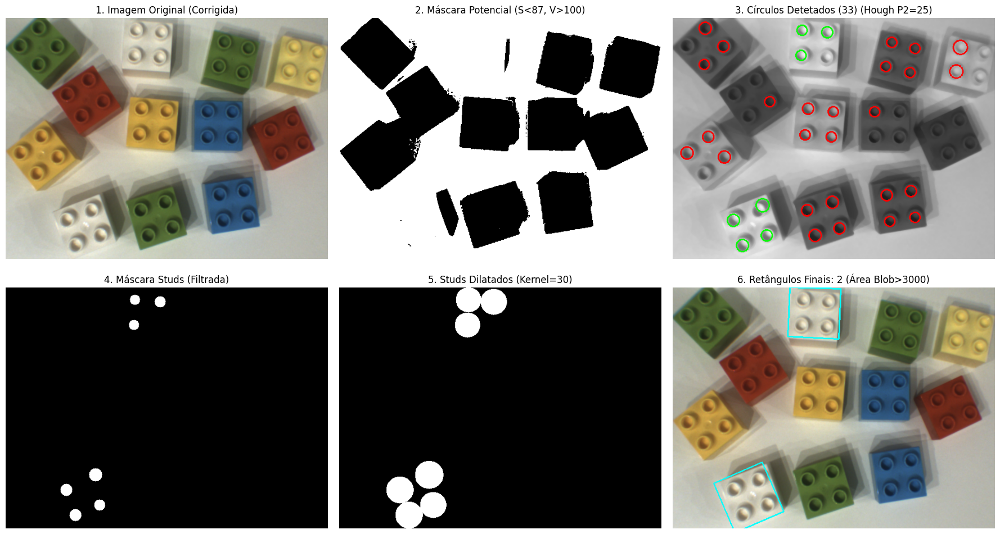

In [41]:
# =========================================================================
# 1. ⚠️ IMPORTS E DEFINIÇÕES ESSENCIAIS
# =========================================================================
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import glob
from pathlib import Path
from dataclasses import dataclass

# --- Funções Críticas ---
def undistort_image(image, K, dist, alpha):
    """ Corrige a distorção da lente da imagem. """
    h, w = image.shape[:2]
    newcamera_K, roi = cv.getOptimalNewCameraMatrix(K, dist, (w,h), alpha, (w,h))
    undst_img = cv.undistort(image, K, dist, None, newcamera_K)
    # Recorta a imagem para remover áreas pretas introduzidas pela correção
    x, y, w_roi, h_roi = roi
    if w_roi > 0 and h_roi > 0:
        undst_img = undst_img[y:y+h_roi, x:x+w_roi]
    return undst_img

def gray_world_wb(img):
    """ Aplica um balanço de brancos simples (Gray World assumption). """
    b,g,r = cv.split(img.astype(np.float32))
    m = (b.mean()+g.mean()+r.mean())/3.0
    # Evita divisão por zero
    b *= m/(b.mean()+1e-6); g *= m/(g.mean()+1e-6); r *= m/(r.mean()+1e-6)
    return np.clip(np.stack([b,g,r],2),0,255).astype(np.uint8)

# --- Classes de Dados ---
class MultiFormat:
    """ Guarda vários formatos (BGR, HSV, Gray) de uma imagem. """
    def __init__(self, *, bgr=None): # Removemos 'rgb' não utilizado
        if bgr is not None:
            self.bgr = bgr
            # Calcula e guarda automaticamente as outras versões
            self.hsv  = cv.cvtColor(self.bgr, cv.COLOR_BGR2HSV)
            self.gray = cv.cvtColor(self.bgr, cv.COLOR_BGR2GRAY)
        # Removemos self.orig_bgr, usando self.bgr como a imagem processada

@dataclass # Simplifica a criação da classe Image
class Image:
    """ Representa uma imagem do dataset com os seus formatos. """
    name: str
    formats: MultiFormat
    # masks: dict = field(default_factory=lambda: {'white': None}) # Removido se não usado no final
    # bricks: list = field(default_factory=list) # Removido se não usado no final


# =========================================================================
# 2. 📸 SETUP E CARREGAMENTO DAS IMAGENS
# =========================================================================

# --- Parâmetros de Calibração da Câmara ---
K = np.array([
    [839.0762, 0.0,      339.3416],
    [0.0,      839.3223, 276.3109],
    [0.0,      0.0,      1.0     ]
])
dist = np.array([-0.4322, 0.2832, -0.0002, 0.0004, -0.1384])
alpha = 0.0 # Controla o recorte após undistort (0=recorta, 1=mantém tudo)

# --- Leitura das Imagens ---
# Certifique-se que este caminho para a pasta 'Isolated' está correto!
isolated_images_folder = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Isolated'

isolated_original_images = sorted(glob.glob(isolated_images_folder + '/*.png'))
isolated_undistorted_images = [] # Lista para guardar os objetos Image processados

print(f"A procurar imagens em: {isolated_images_folder}")
if not isolated_original_images:
    print("AVISO: Nenhuma imagem .png encontrada na pasta especificada.")

for image_path in isolated_original_images:
    img = cv.imread(image_path)
    if img is None:
        print(f"Aviso: Não foi possível ler a imagem: {image_path}")
        continue
    # Corrigir distorção
    undst_img = undistort_image(img, K, dist, alpha)
    image_name = Path(image_path).name
    # Criar objeto Image com a imagem undistorted e os seus formatos
    isolated_undistorted_images.append(Image(image_name, MultiFormat(bgr=undst_img)))

print(f"Carregadas e corrigidas {len(isolated_undistorted_images)} imagens.")

# Verificar se a lista não está vazia antes de continuar
if not isolated_undistorted_images:
     raise FileNotFoundError(f"Nenhuma imagem utilizável encontrada em {isolated_images_folder}. Verifique o caminho e as imagens.")


# =========================================================================
# 3. 🔧 PARÂMETROS AJUSTÁVEIS PARA A DETEÇÃO DE PEÇAS BRANCAS
# =========================================================================

# --- Parâmetros HoughCircles (Deteção de Studs) ---
hough_dp = 1        # Resolução do acumulador (inverso da escala, 1 = escala original)
hough_minDist = 20  # Distância mínima entre centros de círculos detetados (pixels)
hough_param1 = 100  # Threshold superior do Canny interno
hough_param2 = 25   # Threshold do acumulador (mais baixo = mais círculos; mais alto = menos círculos, mais confiáveis)
hough_minRadius = 8 # Raio mínimo do stud (pixels)
hough_maxRadius = 15 # Raio máximo do stud (pixels)

# --- Parâmetros Máscara Potencial Branca (Restringir Busca de Studs) ---
S_MAX_POTENTIAL = 87 # Saturação MÁXIMA para ser considerado área de busca
V_MIN_POTENTIAL = 100 # Valor (Brilho) MÍNIMO para ser considerado área de busca

# --- Parâmetros de Dilatação e Filtros Finais ---
dilation_kernel_size = 30 # Tamanho do kernel para dilatar/juntar os studs (pixels)
dilation_iterations = 1   # Número de vezes que a dilatação é aplicada
min_blob_area_filter = 3000 # Área mínima do blob (após dilatação dos studs) para ser considerado uma peça
max_saturation = 70       # Saturação MÁXIMA média DENTRO do retângulo final para confirmar que é branco/cinza


# =========================================================================
# 4. ⚙️ FUNÇÃO PRINCIPAL: Detetar Peças Brancas via Studs
# =========================================================================

def find_white_rects_via_studs(bgr_image, hsv_image, gray_image):
    """
    Encontra retângulos rotacionados para peças brancas:
    1. Cria máscara aproximada de áreas claras/brancas.
    2. Deteta círculos (studs) nessas áreas.
    3. Cria máscara apenas com os studs detetados e filtrados.
    4. Dilata a máscara de studs para formar blobs (um por peça).
    5. Encontra contornos dos blobs.
    6. Filtra blobs por área mínima.
    7. Calcula retângulo rotacionado mínimo para cada blob válido.
    8. Filtra retângulos por saturação média baixa.
    Retorna lista de vértices dos retângulos finais e máscaras de debug.
    """
    # 1. Máscara Branca Aproximada (para restringir busca de círculos)
    _, mask_S_low = cv.threshold(hsv_image[:,:,1], S_MAX_POTENTIAL, 255, cv.THRESH_BINARY_INV)
    _, mask_V_high = cv.threshold(hsv_image[:,:,2], V_MIN_POTENTIAL, 255, cv.THRESH_BINARY)
    potential_white_mask = cv.bitwise_and(mask_S_low, mask_V_high)

    # 2. Detetar Círculos (Studs)
    # Suavizar imagem gray antes de HoughCircles
    gray_blurred = cv.medianBlur(gray_image, 5)

    # Usar parâmetros HoughCircles definidos globalmente
    circles = cv.HoughCircles(gray_blurred, cv.HOUGH_GRADIENT,
                              dp=hough_dp, minDist=hough_minDist,
                              param1=hough_param1, param2=hough_param2,
                              minRadius=hough_minRadius, maxRadius=hough_maxRadius)

    # 3. Criar Máscara de Studs (apenas os dentro da potential_white_mask)
    stud_mask = np.zeros(gray_image.shape, dtype=np.uint8)
    if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0, :]:
            center = (i[0], i[1])
            radius = i[2]
            # Verificar limites e se o centro está na máscara potencial
            if 0 <= center[1] < potential_white_mask.shape[0] and 0 <= center[0] < potential_white_mask.shape[1]:
                if potential_white_mask[center[1], center[0]] > 0:
                    cv.circle(stud_mask, center, radius, 255, -1) # Desenhar preenchido

    # 4. Expandir/Ligar Studs (Dilatação Forte)
    kernel_dilate = cv.getStructuringElement(cv.MORPH_ELLIPSE, (dilation_kernel_size, dilation_kernel_size))
    dilated_stud_mask = cv.dilate(stud_mask, kernel_dilate, iterations=dilation_iterations)

    # 5. Encontrar Contornos dos Blobs (peças potenciais)
    brick_blob_contours, _ = cv.findContours(dilated_stud_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    kept_rotated_rect_vertices = [] # Lista para guardar os vértices dos retângulos finais

    # 6. Iterar e Filtrar Blobs/Retângulos
    for c in brick_blob_contours:
        # Filtro de área mínima do Blob
        if cv.contourArea(c) < min_blob_area_filter: continue

        # Calcular Retângulo Rotacionado Mínimo
        rect = cv.minAreaRect(c)
        box_vertices = cv.boxPoints(rect)
        box_vertices_int = box_vertices.astype(np.int32)

        # Verificar Saturação Média dentro do Retângulo
        mask_rect = np.zeros(gray_image.shape, np.uint8)
        try:
            cv.drawContours(mask_rect, [box_vertices_int], 0, 255, -1)
        except cv.error as e: # Ignorar contornos que geram retângulos inválidos
            # print(f"Debug: Ignorando retângulo inválido - {e}")
            continue
        if cv.countNonZero(mask_rect) == 0: continue # Ignorar se máscara do retângulo for vazia

        mean_hsv = cv.mean(hsv_image, mask=mask_rect) # Usar imagem HSV original
        saturation = mean_hsv[1]

        # Filtro de Saturação Máxima
        if saturation < max_saturation:
            kept_rotated_rect_vertices.append(box_vertices_int) # Guardar vértices se for branco/cinza

    # Retorna vértices finais e máscaras de debug
    return kept_rotated_rect_vertices, potential_white_mask, gray_blurred, stud_mask, dilated_stud_mask

# =========================================================================
# 5. ✅ BLOCO DE TESTE E VISUALIZAÇÃO
# =========================================================================

# Selecionar a imagem a processar (pelo nome)
target_image_name = 'colored_bricks.png'
colored_img = next((img for img in isolated_undistorted_images if img.name == target_image_name), None)

if colored_img:
    # Chamar a função principal para detetar as peças brancas
    kept_rect_vertices_list, dbg_potential_mask, dbg_gray_blurred, dbg_stud_mask, dbg_dilated_mask = \
        find_white_rects_via_studs(colored_img.formats.bgr, colored_img.formats.hsv, colored_img.formats.gray)

    print(f"\n--- RESULTADO PARA: {target_image_name} ---")
    print(f"Número de peças brancas detetadas: {len(kept_rect_vertices_list)}")

    # --- Visualização do Processo e Resultado ---
    plt.figure(figsize=(18, 10)) # Tamanho da figura para os gráficos

    # 1. Imagem Original (Corrigida)
    plt.subplot(2, 3, 1); plt.imshow(cv.cvtColor(colored_img.formats.bgr, cv.COLOR_BGR2RGB));
    plt.title("1. Imagem Original (Corrigida)")

    # 2. Máscara Potencial Branca
    plt.subplot(2, 3, 2); plt.imshow(dbg_potential_mask, cmap='gray');
    plt.title(f"2. Máscara Potencial (S<{S_MAX_POTENTIAL}, V>{V_MIN_POTENTIAL})")

    # 3. Círculos Detetados (Debug Visual)
    circles_img_dbg = cv.cvtColor(dbg_gray_blurred, cv.COLOR_GRAY2BGR)
    # Recalcular círculos apenas para visualização
    circles_raw = cv.HoughCircles(dbg_gray_blurred, cv.HOUGH_GRADIENT,
                                  dp=hough_dp, minDist=hough_minDist, param1=hough_param1, param2=hough_param2,
                                  minRadius=hough_minRadius, maxRadius=hough_maxRadius)
    num_circles_detected = 0
    if circles_raw is not None:
         circles_raw = np.uint16(np.around(circles_raw))
         num_circles_detected = len(circles_raw[0, :])
         for i in circles_raw[0, :]:
             center = (i[0], i[1])
             radius = i[2]
             # Desenhar a verde se o centro estiver na máscara potencial, a vermelho caso contrário
             color = (0, 255, 0) # Verde por defeito
             if not (0 <= center[1] < dbg_potential_mask.shape[0] and 0 <= center[0] < dbg_potential_mask.shape[1] and dbg_potential_mask[center[1], center[0]] > 0):
                 color = (0, 0, 255) # Vermelho se fora da máscara potencial
             cv.circle(circles_img_dbg, center, radius, color, 2)
             #cv.circle(circles_img_dbg, center, 2, (255, 0, 0), 3) # Centro a azul
    plt.subplot(2, 3, 3); plt.imshow(cv.cvtColor(circles_img_dbg, cv.COLOR_BGR2RGB));
    plt.title(f"3. Círculos Detetados ({num_circles_detected}) (Hough P2={hough_param2})")

    # 4. Máscara de Studs (Após Filtragem pela Máscara Potencial)
    plt.subplot(2, 3, 4); plt.imshow(dbg_stud_mask, cmap='gray');
    plt.title("4. Máscara Studs (Filtrada)")

    # 5. Máscara de Studs Dilatados (Blobs)
    plt.subplot(2, 3, 5); plt.imshow(dbg_dilated_mask, cmap='gray');
    plt.title(f"5. Studs Dilatados (Kernel={dilation_kernel_size})")

    # 6. Retângulos Finais na Imagem Original
    image_with_rects = colored_img.formats.bgr.copy()
    cv.drawContours(image_with_rects, kept_rect_vertices_list, -1, (255, 255, 0), 2) # Ciano
    plt.subplot(2, 3, 6); plt.imshow(cv.cvtColor(image_with_rects, cv.COLOR_BGR2RGB))
    plt.title(f"6. Retângulos Finais: {len(kept_rect_vertices_list)} (Área Blob>{min_blob_area_filter})")

    # Remover eixos de todos os subplots
    for i in range(1, 7):
        plt.subplot(2, 3, i).axis('off')

    plt.tight_layout(pad=1.5) # Ajustar espaçamento
    plt.show()

else:
    print(f"Erro Crítico: A imagem '{target_image_name}' não foi encontrada na lista de imagens carregadas.")